DATA SCIENCE ASSIGNMENT

The goal of this assignment is to demonstrate to us your ability to manage a real-world data set, to communicate and contextualize summary statistics, and, most importantly, your creativity and analytical rigor in generating and testing hypotheses. The assignment is intentionally nonspecific and exploratory in nature. 

The data set at hand captures permits issued by the New York City Department Of Buildings (DOB), and can be accessed here. We strongly encourage you to merge the NYC permit data with other data sets to contextualize your investigation. Mindful of the time we are giving you to complete this assignment, we recommend somewhat narrowly focusing your investigation. We're looking for a document that summarizes your investigation and findings.


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
%matplotlib inline

In [5]:
np.random.seed(1)
def skip(row):
    if row == 0: #preserve header
        return False
    return np.random.random() > 0.01
raw = pd.read_csv('DOB_Permit_Issuance.csv', skiprows=skip, header=0)

/home/harinsa/miniconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (33,35,51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [6]:
df = raw.copy()

In [7]:
cat = df.columns[df.dtypes == 'object'].tolist()
cont = list(set(df.columns) - set(cat))

In [8]:
df.columns.tolist()

['BOROUGH',
 'Bin #',
 'House #',
 'Street Name',
 'Job #',
 'Job doc. #',
 'Job Type',
 'Self_Cert',
 'Block',
 'Lot',
 'Community Board',
 'Zip Code',
 'Bldg Type',
 'Residential',
 'Special District 1',
 'Special District 2',
 'Work Type',
 'Permit Status',
 'Filing Status',
 'Permit Type',
 'Permit Sequence #',
 'Permit Subtype',
 'Oil Gas',
 'Site Fill',
 'Filing Date',
 'Issuance Date',
 'Expiration Date',
 'Job Start Date',
 "Permittee's First Name",
 "Permittee's Last Name",
 "Permittee's Business Name",
 "Permittee's Phone #",
 "Permittee's License Type",
 "Permittee's License #",
 'Act as Superintendent',
 "Permittee's Other Title",
 'HIC License',
 "Site Safety Mgr's First Name",
 "Site Safety Mgr's Last Name",
 'Site Safety Mgr Business Name',
 'Superintendent First & Last Name',
 'Superintendent Business Name',
 "Owner's Business Type",
 'Non-Profit',
 "Owner's Business Name",
 "Owner's First Name",
 "Owner's Last Name",
 "Owner's House #",
 "Owner's House Street Name",
 '

# start with date

In [9]:
date_cols = [
'Filing Date',
 'Issuance Date',
 'Expiration Date',
 'Job Start Date'
]

In [10]:
for c in date_cols:
    df[c] = pd.to_datetime(df[c])

In [11]:
df[date_cols].isna().sum() / df.shape[0]

Filing Date        0.000000
Issuance Date      0.005919
Expiration Date    0.002859
Job Start Date     0.000000
dtype: float64

expect date order: file -> issu -> start -> expire

In [12]:
df['permit_duration'] = (df['Expiration Date'] - df['Issuance Date'])
df['Residential'] = df['Residential'].replace(np.nan, 'NO')

In [142]:
nonna_index = ~df['Zip Code'].isna()
df.loc[nonna_index, 'Zip Code'] = df.loc[nonna_index, 'Zip Code'].astype(int).astype(str)

In [13]:
df['permit_duration'].dropna().describe()

count                       34768
mean     272 days 01:35:18.085595
std      136 days 15:12:27.283061
min               0 days 00:00:00
25%             174 days 00:00:00
50%             320 days 00:00:00
75%             365 days 00:00:00
max            9805 days 00:00:00
Name: permit_duration, dtype: object

In [14]:
permit_by_day = df.groupby('permit_duration').count()[['Lot']]

In [15]:
np.quantile(permit_by_day , 0.95)

76.5

In [16]:
permit_by_day.index = permit_by_day.index.days

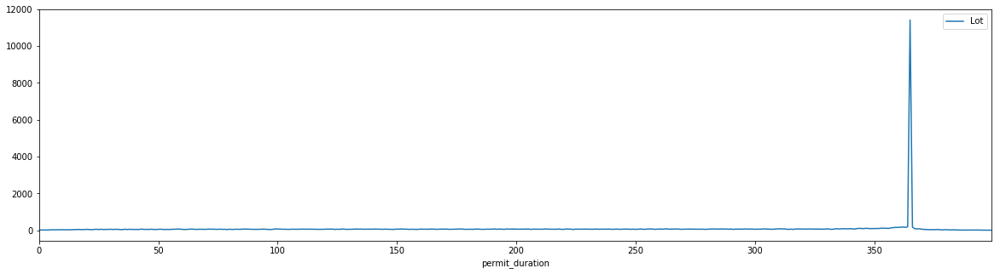

In [17]:
permit_by_day[permit_by_day.index < 400].plot(figsize=(20,5));

In [18]:
permit_by_day[permit_by_day.Lot == permit_by_day.max().Lot]

,Lot
permit_duration,
365,11421


In [19]:
df['Issuance Date'].dt.year.unique()

array([2019., 2018., 2017., 2016., 2015., 2014., 2013., 2012., 2011.,
       2010., 2009., 2008., 2007., 2006., 2005., 2004., 2003., 2002.,
       2001., 2000., 1999., 1998., 1997., 1996., 1995., 1994., 1993.,
       1992., 1991., 1990., 1989.,   nan])

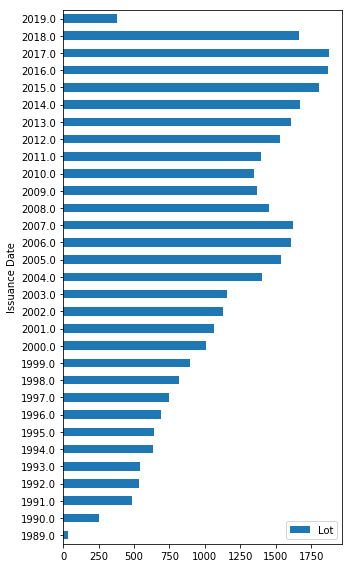

In [20]:
df.groupby(df['Issuance Date'].dt.year).count()[['Lot']].plot.barh(figsize=(5,8))
plt.tight_layout()

# Work Type

In [21]:
df['Work Type'].unique().shape

(13,)

In [22]:
df['Work Type'].unique().tolist()

['MH', 'OT', 'PL', nan, 'SP', 'EQ', 'SD', 'BL', 'FS', 'FP', 'CC', 'FB', 'FA']

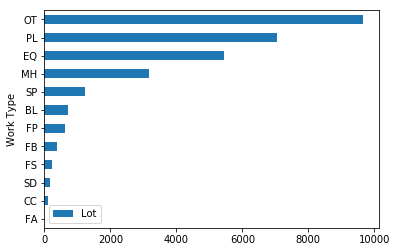

In [23]:
df.groupby('Work Type').count()[['Lot']].sort_values('Lot').plot.barh()

In [24]:
df[~df['Oil Gas'].isna()].shape

(366, 61)

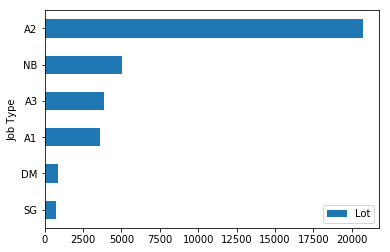

In [25]:
df.groupby('Job Type').count()[['Lot']].sort_values('Lot').plot.barh()

skip Bin # 27138
skip House # 8485
skip Street Name 6835
skip Job # 34429
skip Block 8226
skip Lot 595
skip Community Board 77
skip Zip Code 218
skip Special District 1 68
skip Filing Date 7120
skip Issuance Date 7124
skip Expiration Date 8587
skip Job Start Date 7163
skip Permittee's First Name 3914
skip Permittee's Last Name 9023
skip Permittee's Business Name 19056
skip Permittee's Phone # 13011
skip Permittee's License # 10029
skip Permittee's Other Title 189
skip HIC License 221
skip Site Safety Mgr's First Name 122
skip Site Safety Mgr's Last Name 178
skip Site Safety Mgr Business Name 110
skip Superintendent First & Last Name 8796
skip Superintendent Business Name 12469
skip Owner's Business Name 20883
skip Owner's First Name 7405
skip Owner's Last Name 15333
skip Owner's House # 7297
skip Owner's House Street Name 12134
skip Owner’s House City 1448
skip Owner’s House State 38
skip Owner’s House Zip Code 1620
skip Owner's Phone # 22280
skip DOBRunDate 340
skip PERMIT_SI_NO 34975

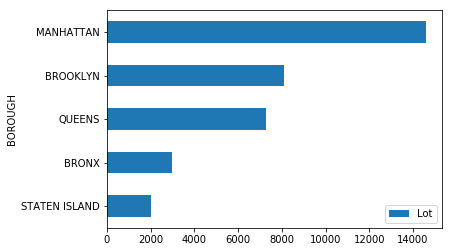

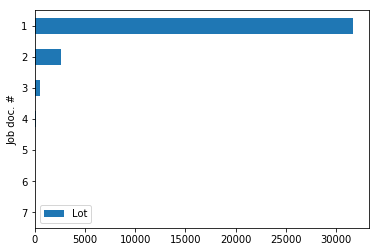

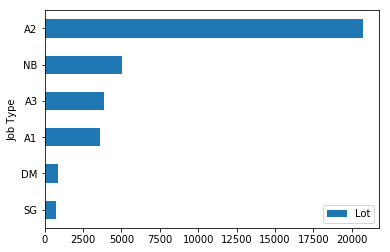

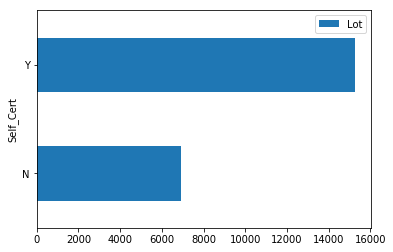

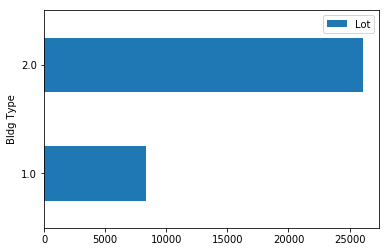

...

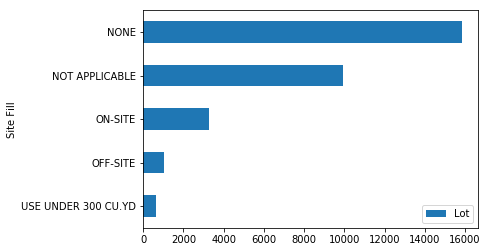

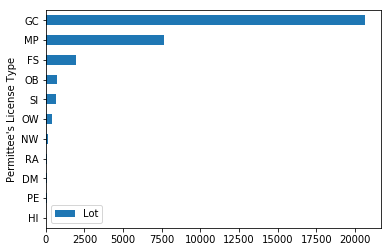

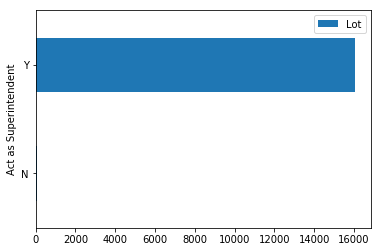

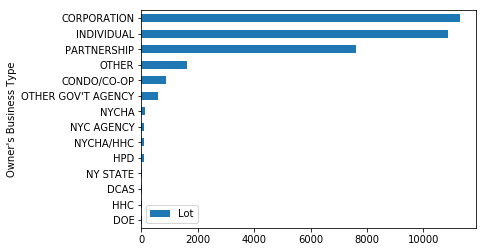

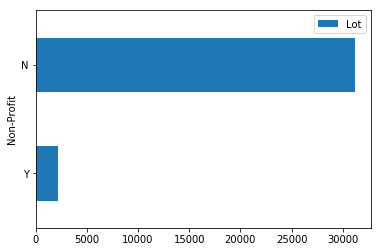

In [108]:
for c in df.columns:
    u = df[c].unique()
    if len(u) > 20:
        print('skip', c,len(u))
        continue
    df.groupby(c).count()[['Lot']].sort_values('Lot').plot.barh()

In [59]:
def plot_value(df, columns):
    nyc_coord = [40.713, -74.0071]
    map1 = folium.Map(
        width=500,
        height=500,
        location=nyc_coord, zoom_start=12, 
        zoom_control=False,
        tiles='Stamen Toner',)
    folium.Choropleth(geo_data = 'zipcode.geojson',
                      data = df,
                      columns = columns,
                      key_on = 'feature.properties.postalCode',
                      fill_color = 'YlOrRd', 
                      fill_opacity = 0.7, 
                      line_opacity = 0.2,
        ).add_to(map1)
    return map1

In [60]:
d = df.groupby('Zip Code').count()[['Lot']].reset_index()
d.columns = ['postalCode', 'Lot']
d.postalCode = d.postalCode.astype('int').astype(str)

plot_value(d, ['postalCode', 'Lot'])

In [61]:
d = df[df['Issuance Date'].dt.year ==2019].groupby('Zip Code').count()[['Lot']].reset_index()
d.columns = ['postalCode', 'Lot']
d.postalCode = d.postalCode.astype('int').astype(str)

plot_value(d, ['postalCode', 'Lot'])

In [62]:
d = df[df['Issuance Date'].dt.year == 2018].groupby('Zip Code').count()[['Lot']].reset_index()
d.columns = ['postalCode', 'Lot']
d.postalCode = d.postalCode.astype('int').astype(str)

plot_value(d, ['postalCode', 'Lot'])

In [63]:
d = df[df['Issuance Date'].dt.year == 2017].groupby('Zip Code').count()[['Lot']].reset_index()
d.columns = ['postalCode', 'Lot']
d.postalCode = d.postalCode.astype('int').astype(str)

plot_value(d, ['postalCode', 'Lot'])

In [64]:
d = df[(df['Issuance Date'].dt.year > 2000) & (df['Issuance Date'].dt.year < 2010)].groupby('Zip Code').count()[['Lot']].reset_index()
d.columns = ['postalCode', 'Lot']
d.postalCode = d.postalCode.astype('int').astype(str)

plot_value(d, ['postalCode', 'Lot'])

In [65]:
d = df[(df['Issuance Date'].dt.year > 1990) & (df['Issuance Date'].dt.year < 2000)].groupby('Zip Code').count()[['Lot']].reset_index()
d.columns = ['postalCode', 'Lot']
d.postalCode = d.postalCode.astype('int').astype(str)

plot_value(d, ['postalCode', 'Lot'])

In [66]:
d = df[(df['Issuance Date'].dt.year > 1980) & (df['Issuance Date'].dt.year < 1990)].groupby('Zip Code').count()[['Lot']].reset_index()
d.columns = ['postalCode', 'Lot']
d.postalCode = d.postalCode.astype('int').astype(str)
plot_value(d, ['postalCode', 'Lot'])

In [72]:
d = df[df['Job Type'] == 'NB'].groupby('Zip Code').count()[['Lot']].reset_index()
d.columns = ['postalCode', 'Lot']
d.postalCode = d.postalCode.astype('int').astype(str)
plot_value(d, ['postalCode', 'Lot'])

In [74]:
d = df[(df['Job Type'] == 'NB') & (df['Issuance Date'].dt.year > 2015)].groupby('Zip Code').count()[['Lot']].reset_index()
d.columns = ['postalCode', 'Lot']
d.postalCode = d.postalCode.astype('int').astype(str)
plot_value(d, ['postalCode', 'Lot'])

In [80]:
df['issue_year' ] = df['Issuance Date'].dt.year

# Job Type
- NB: Construction of new structures
- ALT1: Major alterations that will change use, egress or occupancy
- ALT2: Multiple types of work, not affecting use, egress or occupancy
- ALT3: One type of minor work, not affecting use, egress or occupancy

https://www1.nyc.gov/site/buildings/homeowner/permits.page

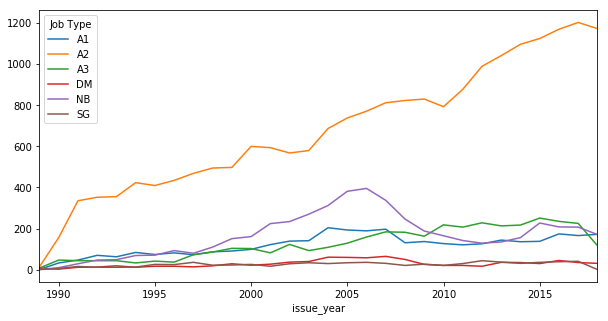

In [109]:
d = df.groupby(['Job Type', 'issue_year']).count()[['Lot']].unstack().T
d.index = d.index.get_level_values(1)
d[d.index < 2019].plot(figsize=(10,5))

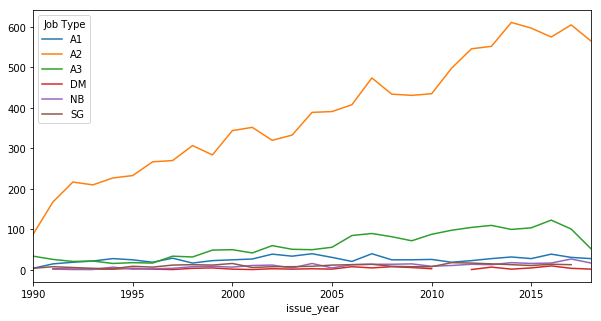

In [110]:
d = df[df.BOROUGH == 'MANHATTAN'].groupby(['Job Type', 'issue_year']).count()[['Lot']].unstack().T
d.index = d.index.get_level_values(1)
d[d.index < 2019].plot(figsize=(10,5))

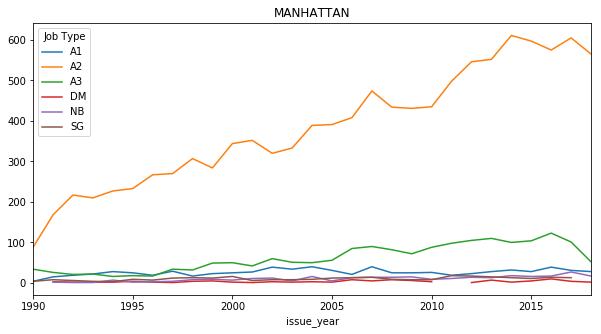

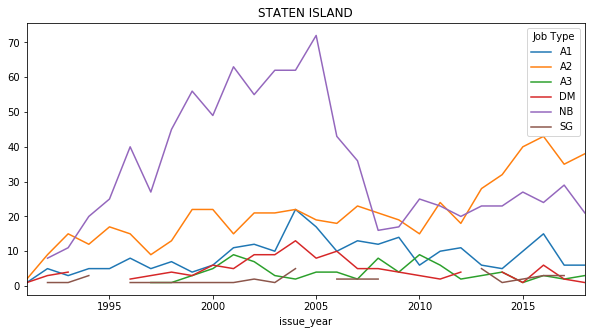

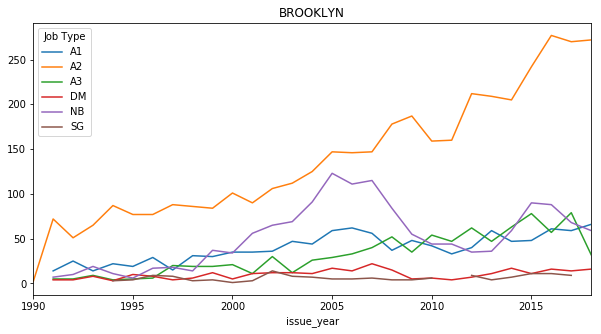

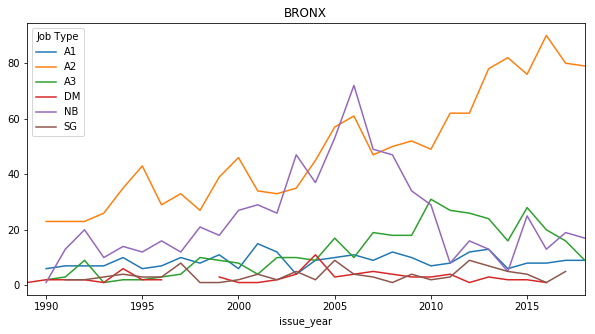

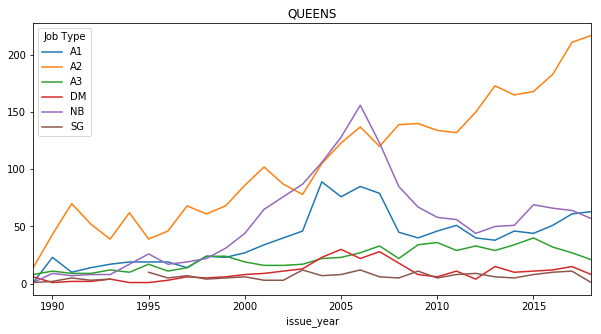

In [112]:
for b in df.BOROUGH.unique():
    d = df[df.BOROUGH == b].groupby(['Job Type', 'issue_year']).count()[['Lot']].unstack().T
    d.index = d.index.get_level_values(1)
    d[d.index < 2019].plot(figsize=(10,5),title=b)

In [ ]:
for b in df.BOROUGH.unique():
    d = df[df.BOROUGH == b].groupby(['Job Type', 'issue_year']).count()[['Lot']].unstack().T
    d.index = d.index.get_level_values(1)
    d[d.index < 2019].plot(figsize=(10,5),title=b)

In [118]:
top_zip = df.groupby('Zip Code').count()[['Lot']].sort_values('Lot', ascending=False).head(20)

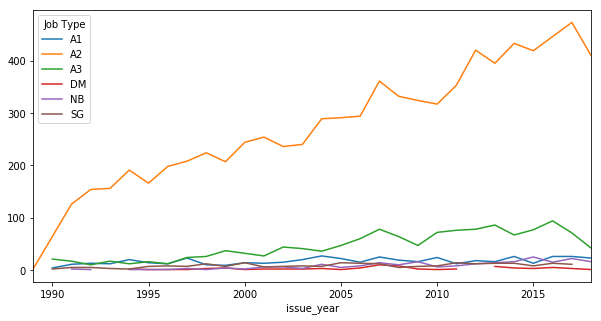

In [122]:
d = df[df['Zip Code'].isin(top_zip.index)].groupby(['Job Type', 'issue_year']).count()[['Lot']].unstack().T
d.index = d.index.get_level_values(1)
d[d.index < 2019].plot(figsize=(10,5)) 

In [126]:
d = top_zip.reset_index()
d['Zip Code'] = d['Zip Code'].astype(int).astype(str)

In [128]:
plot_value(d, ['Zip Code', 'Lot'])

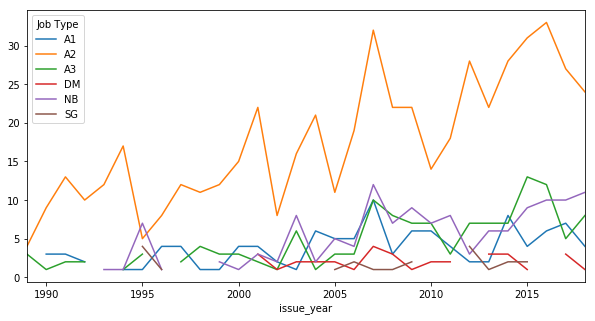

In [147]:
long_island_city_zip = ['11101', '11102', '11103', '11104', '11105', '11106', '11109',
       '11120']
d = df[df['Zip Code'].isin(long_island_city_zip)].groupby(['Job Type', 'issue_year']).count()[['Lot']].unstack().T
d.index = d.index.get_level_values(1)
d[d.index < 2019].plot(figsize=(10,5)) 

In [149]:
d = df[df['Zip Code'].isin(long_island_city_zip)].groupby(['Zip Code']).count()[['Lot']].reset_index()
plot_value(d, ['Zip Code', 'Lot'])

In [151]:
df.columns

Index(['BOROUGH', 'Bin #', 'House #', 'Street Name', 'Job #', 'Job doc. #',
       'Job Type', 'Self_Cert', 'Block', 'Lot', 'Community Board', 'Zip Code',
       'Bldg Type', 'Residential', 'Special District 1', 'Special District 2',
       'Work Type', 'Permit Status', 'Filing Status', 'Permit Type',
       'Permit Sequence #', 'Permit Subtype', 'Oil Gas', 'Site Fill',
       'Filing Date', 'Issuance Date', 'Expiration Date', 'Job Start Date',
       'Permittee's First Name', 'Permittee's Last Name',
       'Permittee's Business Name', 'Permittee's Phone #',
       'Permittee's License Type', 'Permittee's License #',
       'Act as Superintendent', 'Permittee's Other Title', 'HIC License',
       'Site Safety Mgr's First Name', 'Site Safety Mgr's Last Name',
       'Site Safety Mgr Business Name', 'Superintendent First & Last Name',
       'Superintendent Business Name', 'Owner's Business Type', 'Non-Profit',
       'Owner's Business Name', 'Owner's First Name', 'Owner's Last Name',
 